# Cluster Annotation

In [1]:
here::i_am("rna_atac/clustering/02_clustering.ipynb")

source(here::here("settings.R"))
source(here::here("utils.R"))

suppressPackageStartupMessages(library(scran))
suppressPackageStartupMessages(library(scater))
suppressPackageStartupMessages(library(Seurat))
suppressPackageStartupMessages(library(dplyr))
suppressPackageStartupMessages(library(ArchR))

BPPARAM <- BiocParallel::bpparam()
BPPARAM$workers = 21

# Multi core using future - built in to seurat
plan("multicore", workers = 16)
options(future.globals.maxSize = 50 * 1024 ^ 3) # for 50 Gb RAM

here() starts at /rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/code


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
        

In [2]:
args = list()
# UMAP
args$MOFA_factors = file.path(io$basedir, 'results/rna_atac/dimensionality_reduction/mofa/MOFA_factors.txt.gz')
args$MOFA_umap = file.path(io$basedir, 'results/rna_atac/dimensionality_reduction/mofa/MOFA_umap.txt.gz')

# RNA_sce
args$rna_sce = file.path(io$basedir, 'processed/rna/SingleCellExperiment.rds')

# Archr
args$archr_directory = file.path(io$basedir, 'processed/atac/archR')

# Mapping Luke
#args$integrated_object = '/rds/project/rds-SDzz0CATGms/users/ltgh2/projects/01_Eomes_invitro_HE_multiome/processed/rna/seurat_objects/all_anchors_20_rPCA.rds'

# outdir
args$outdir = file.path(io$basedir, 'results/rna_atac/clustering/')

# Metadata
args$metadata = file.path(args$outdir, 'metadata_mofa_clusters.txt.gz')

# Mapping metadata
args$mapping = file.path(io$basedir, 'results/rna/mapping/sample_metadata_after_mapping.txt.gz')

In [3]:
# Load meta
meta = fread(args$metadata)

# Load mofa 
umap = fread(args$MOFA_umap)

## RNA

In [4]:
# load sce
rna.sce <- load_SingleCellExperiment(args$rna_sce, normalise = TRUE, cells = meta$cell)
colData(rna.sce) = meta %>% as.data.frame() %>% tibble::column_to_rownames('cell') %>% DataFrame()

# Convert to Seurat
seurat = as.Seurat(rna.sce)

In [5]:
# Prepare mofa umap
umap.mtx = umap[match(meta$cell, cell)] %>% 
    as.data.frame(.) %>% 
    tibble::column_to_rownames('cell') %>%
    as.matrix()
seurat[["umap"]] <- CreateDimReducObject(embeddings = umap.mtx, key = "umap_", assay = DefaultAssay(seurat))

In [6]:
Idents(seurat) = seurat@meta.data$mofa_cluster

#### Seurat

In [74]:
# Marker detection
markers <- FindAllMarkers(seurat, 
                          only.pos = TRUE, 
                          min.pct = 0.1,
                          logfc.threshold = 0.2, 
                          verbose = F)

In [75]:
library(dplyr)
markers_top = markers %>%
    group_by(cluster) %>%
    slice_max(n = 15, order_by = avg_log2FC)

fwrite(markers_top, sprintf('%s/markers_RNA_top.csv', args$outdir))
fwrite(markers, sprintf('%s/markers_RNA.csv', args$outdir))

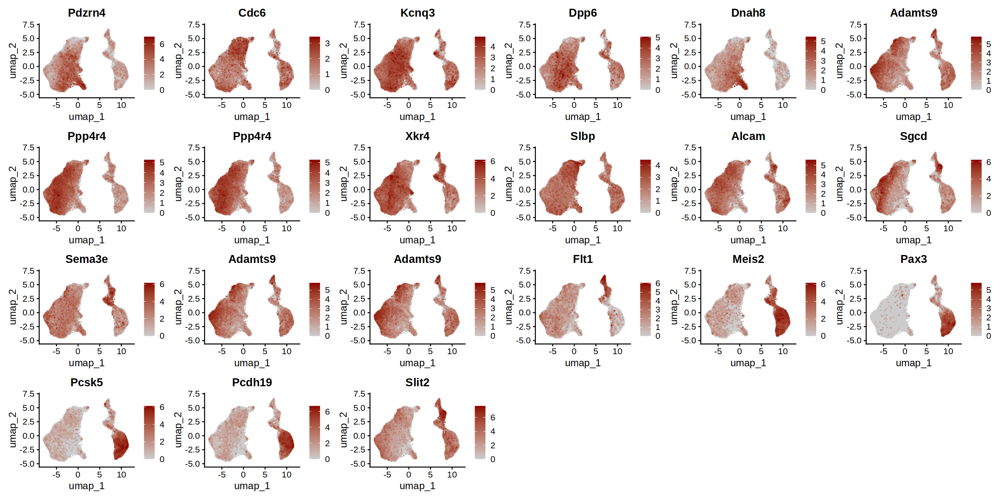

In [76]:
features = markers %>%
    group_by(cluster) %>%
    slice_max(n = 1, order_by = avg_log2FC) %>% .$gene

options(repr.plot.width=20, repr.plot.height=10)
FeaturePlot(seurat, 
            features = features, 
            cols = c('grey80', 'darkred'),
            ncol = 6,
            order = T)

In [77]:
clusters_bu = seurat@meta.data$mofa_cluster

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


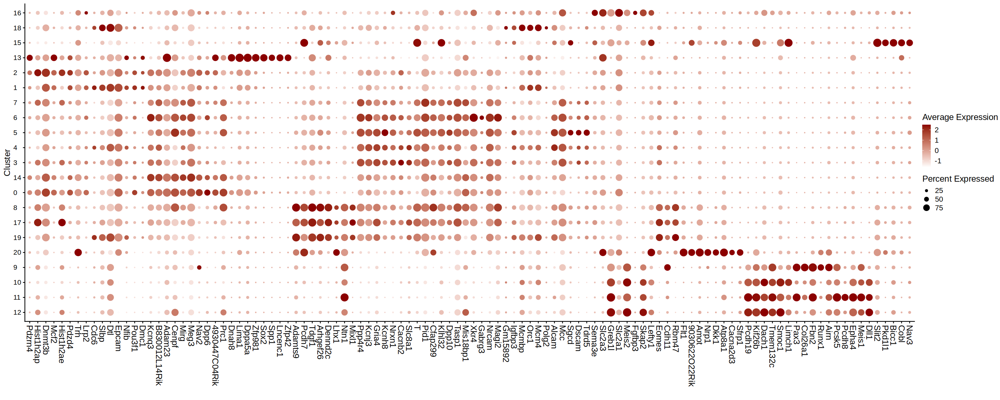

In [78]:
features = markers %>%
    group_by(cluster) %>%
    slice_max(n = 8, order_by = avg_log2FC) %>% .$gene

#cluster_levels = c(0:length(unique(markers$cluster)-1))
cluster_levels = c(12,11,10,9,
                   20,19,17,8,
                   
                   0,14,
                   3,4,5,6,7,
                   1,2,
                   
                   13, 15, 18, 16
                  )

seurat@meta.data$mofa_cluster = factor(seurat@meta.data$mofa_cluster, levels = cluster_levels)

options(repr.plot.width=25, repr.plot.height=10)
DotPlot(seurat, features = unique(features), group.by = 'mofa_cluster') + 
    scale_color_gradient(low='white', high='darkred', name='Average Expression') + 
    RotatedAxis() +
    ylab('Cluster') + xlab('') +
    theme(text=element_text(size=15), 
                         axis.text.x=element_text(angle=-90,hjust=0,vjust=0.5, size=15), 
                         axis.text.y=element_text(hjust=0))

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


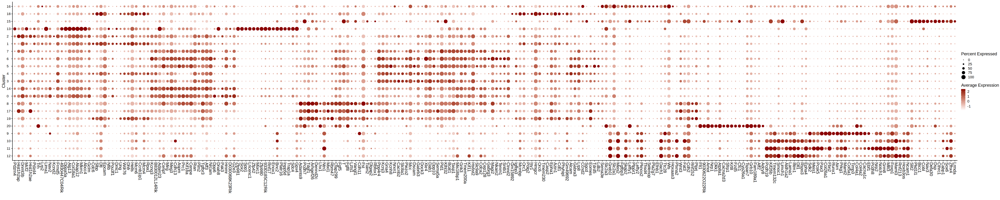

In [79]:
features = markers %>%
    group_by(cluster) %>%
    slice_max(n = 20, order_by = avg_log2FC) %>% .$gene

#cluster_levels = c(0:length(unique(markers$cluster)-1))
cluster_levels = c(12,11,10,9,
                   20,19,17,8,
                   0,14,
                   3,4,5,6,7,
                   1,2,
                   13, 15, 18, 16
                  )

seurat@meta.data$mofa_cluster = factor(seurat@meta.data$mofa_cluster, levels = cluster_levels)

options(repr.plot.width=50, repr.plot.height=10)
DotPlot(seurat, features = unique(features), group.by = 'mofa_cluster') + 
    scale_color_gradient(low='white', high='darkred', name='Average Expression') + 
    RotatedAxis() +
    ylab('Cluster') + xlab('') +
    theme(text=element_text(size=15), 
                         axis.text.x=element_text(angle=-90,hjust=0,vjust=0.5, size=15), 
                         axis.text.y=element_text(hjust=0))

#### Within early timepoints

In [80]:
unique(seurat@meta.data$day)

[1] "D2.5" "D3"   "D4.5"

In [81]:
seurat_early = seurat[,seurat@meta.data$day %in% c('D2.5', 'D3')]

In [82]:
# Marker detection
markers <- FindAllMarkers(seurat_early, 
                          only.pos = TRUE, 
                          min.pct = 0.1,
                          logfc.threshold = 0.2, 
                          verbose = F)

In [83]:
library(dplyr)
markers_top = markers %>%
    group_by(cluster) %>%
    slice_max(n = 15, order_by = avg_log2FC)

fwrite(markers_top, sprintf('%s/markers_RNA_top_early.csv', args$outdir))
fwrite(markers, sprintf('%s/markers_RNA_early.csv', args$outdir))

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


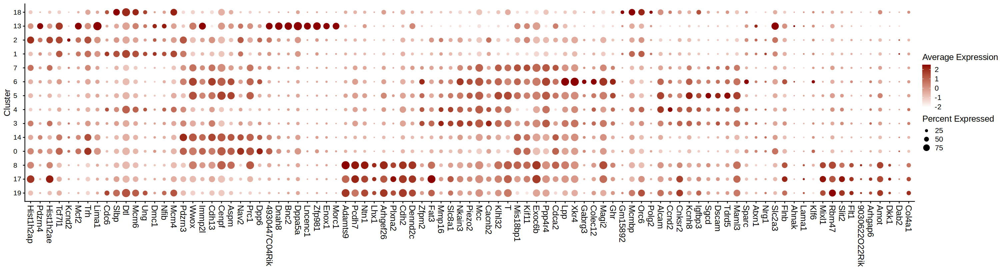

In [84]:
features = markers %>%
    group_by(cluster) %>%
    slice_max(n = 8, order_by = avg_log2FC) %>% .$gene

#cluster_levels = c(0:length(unique(markers$cluster)-1))
cluster_levels = c(12,11,10,9,
                   20,19,17,8,
                   
                   0,14,
                   3,4,5,6,7,
                   1,2,
                   
                   13, 15, 18, 16
                  )

seurat_early@meta.data$mofa_cluster = factor(seurat_early@meta.data$mofa_cluster, levels = cluster_levels)
seurat_early = seurat_early[, !seurat_early@meta.data$mofa_cluster %in% c(9,10,11,12,15,16,20)]

options(repr.plot.width=25, repr.plot.height=7)
DotPlot(seurat_early, features = unique(features), group.by = 'mofa_cluster') + 
    scale_color_gradient(low='white', high='darkred', name='Average Expression') + 
    RotatedAxis() +
    ylab('Cluster') + xlab('') +
    theme(text=element_text(size=15), 
                         axis.text.x=element_text(angle=-90,hjust=0,vjust=0.5, size=15), 
                         axis.text.y=element_text(hjust=0))

#### Within late timepoint

In [85]:
seurat_late = seurat[,seurat@meta.data$day %in% c('D4.5')]

In [86]:
# Marker detection
markers <- FindAllMarkers(seurat_late, 
                          only.pos = TRUE, 
                          min.pct = 0.1,
                          logfc.threshold = 0.2, 
                          verbose = F)

In [87]:
library(dplyr)
markers_top = markers %>%
    group_by(cluster) %>%
    slice_max(n = 15, order_by = avg_log2FC)

fwrite(markers_top, sprintf('%s/markers_RNA_top_late.csv', args$outdir))
fwrite(markers, sprintf('%s/markers_RNA_late.csv', args$outdir))

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


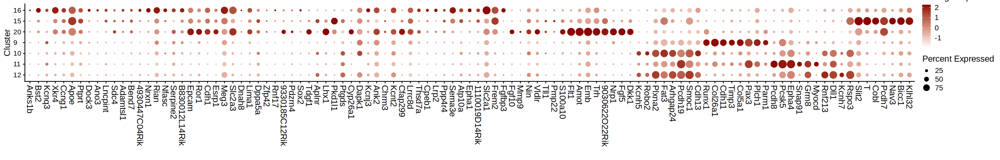

In [88]:
features = markers %>%
    group_by(cluster) %>%
    slice_max(n = 8, order_by = avg_log2FC) %>% .$gene

#cluster_levels = c(0:length(unique(markers$cluster)-1))
cluster_levels = c(12,11,10,9,
                   20,19,17,8,
                   
                   0,14,
                   3,4,5,6,7,
                   1,2,
                   
                   13, 15, 18, 16
                  )

seurat_late@meta.data$mofa_cluster = factor(seurat_late@meta.data$mofa_cluster, levels = cluster_levels)
seurat_late = seurat_late[, seurat_late@meta.data$mofa_cluster %in% c(9,10,11,12,15,16,20)]

options(repr.plot.width=25, repr.plot.height=4)
DotPlot(seurat_late, features = unique(features), group.by = 'mofa_cluster') + 
    scale_color_gradient(low='white', high='darkred', name='Average Expression') + 
    RotatedAxis() +
    ylab('Cluster') + xlab('') +
    theme(text=element_text(size=15), 
                         axis.text.x=element_text(angle=-90,hjust=0,vjust=0.5, size=15), 
                         axis.text.y=element_text(hjust=0))

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


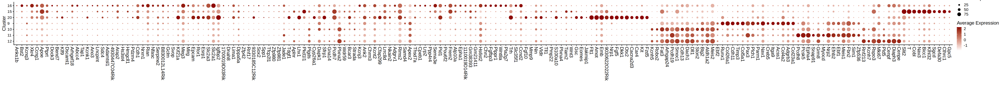

In [89]:
features = markers %>%
    group_by(cluster) %>%
    slice_max(n = 15, order_by = avg_log2FC) %>% .$gene

#cluster_levels = c(0:length(unique(markers$cluster)-1))
cluster_levels = c(12,11,10,9,
                   20,19,17,8,
                   
                   0,14,
                   3,4,5,6,7,
                   1,2,
                   
                   13, 15, 18, 16
                  )

seurat_late@meta.data$mofa_cluster = factor(seurat_late@meta.data$mofa_cluster, levels = cluster_levels)
seurat_late = seurat_late[, seurat_late@meta.data$mofa_cluster %in% c(9,10,11,12,15,16,20)]

options(repr.plot.width=45, repr.plot.height=4)
DotPlot(seurat_late, features = unique(features), group.by = 'mofa_cluster') + 
    scale_color_gradient(low='white', high='darkred', name='Average Expression') + 
    RotatedAxis() +
    ylab('Cluster') + xlab('') +
    theme(text=element_text(size=15), 
                         axis.text.x=element_text(angle=-90,hjust=0,vjust=0.5, size=15), 
                         axis.text.y=element_text(hjust=0))

#### Manually grouping clusters together 

In [7]:
opts$clusters2groups = c(
    '0' = 'C3',
    '1' = 'C8',
    '2' = 'C11',
    '3' = 'C2',
    '4' = 'C2',
    '5' = 'C2',
    '6' = 'C2',
    '7' = 'C2',
    '8' = 'C4',
    '9' = 'C10',
    '10' = 'C1',
    '11' = 'C1',
    '12' = 'C1',
    '13' = 'C6',
    '14' = 'C3',
    '15' = 'C5',
    '16' = 'C9',
    '17' = 'C4',
    '18' = 'C8',
    '19' = 'C4',
    '20' = 'C7'
)

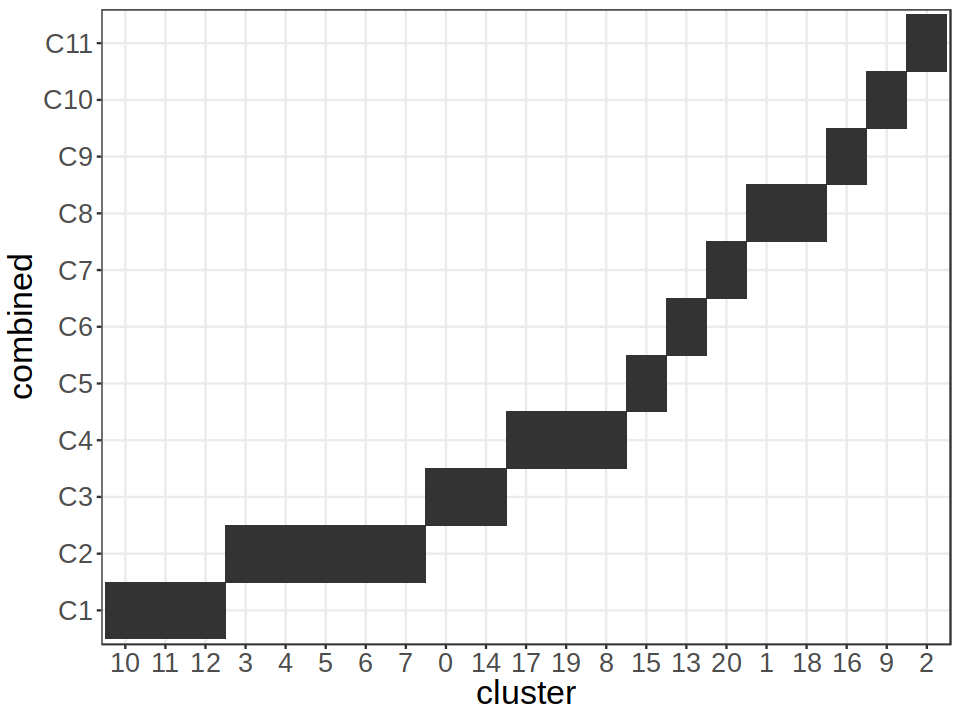

In [35]:
options(repr.plot.width=8, repr.plot.height=6)
ggplot(as.data.table(opts$clusters2groups, keep.rownames = T), aes(V1,V2)) + 
    geom_tile() + 
    scale_y_discrete(limits = factor(paste0('C', 1:11))) + 
    scale_x_discrete(limits = factor(c(10:12, 3:7, 0,14,17,19,8,15,13,20,1,18,16,9,2))) + 
    labs(x = 'cluster', y = 'combined') + 
    theme_bw() +
    theme(text = element_text(size = 20))

In [8]:
seurat@meta.data$clusters_grouped = opts$clusters2groups[match(as.character(Idents(seurat)), names(opts$clusters2groups))]

In [9]:
Idents(seurat) = seurat@meta.data$clusters_grouped

In [15]:
# Marker detection
markers <- FindAllMarkers(seurat, 
                          only.pos = TRUE, 
                          min.pct = 0.1,
                          logfc.threshold = 0.2, 
                          verbose = F)

In [36]:
library(dplyr)
markers_top = markers %>%
    group_by(cluster) %>%
    slice_max(n = 15, order_by = avg_log2FC)

fwrite(markers_top, sprintf('%s/markers_RNA_top_grouped_clusters.csv', args$outdir))
fwrite(markers, sprintf('%s/markers_RNA_grouped_clusters.csv', args$outdir))

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


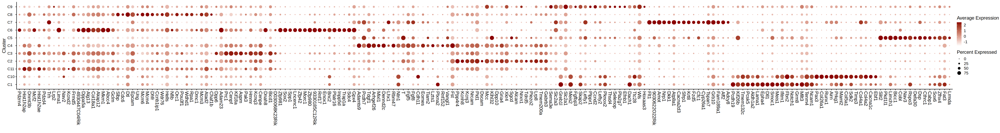

In [18]:
features = markers %>%
    group_by(cluster) %>%
    slice_max(n = 20, order_by = avg_log2FC) %>% .$gene

options(repr.plot.width=45, repr.plot.height=6)
DotPlot(seurat, features = unique(features), group.by = 'clusters_grouped') + 
    scale_color_gradient(low='white', high='darkred', name='Average Expression') + 
    RotatedAxis() +
    ylab('Cluster') + xlab('') +
    theme(text=element_text(size=15), 
                         axis.text.x=element_text(angle=-90,hjust=0,vjust=0.5, size=15), 
                         axis.text.y=element_text(hjust=0))

## ATAC

In [7]:
args$archr_directory = file.path(io$basedir, 'processed/atac/archR')
ArchRProject <- loadArchRProject(args$archr_directory)[meta$cell]
ArchRProject = ArchRProject[meta$cell]

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
           ___      .______        ______  __    __  .____

In [8]:
addArchRThreads(22)

Setting default number of Parallel threads to 22.



In [9]:
summary(colnames(seurat) == meta$cell)

   Mode    TRUE 
logical   46547 

In [10]:
ArchRProject <- addCellColData(ArchRProj = ArchRProject, 
                                    data = as.numeric(meta$mofa_cluster),
                                    cells = meta$cell,
                                    name = "mofa_cluster",
                                    force=TRUE)

ArchRProject <- addCellColData(ArchRProj = ArchRProject, 
                                    data = seurat@meta.data$clusters_grouped,
                                    cells = meta$cell,
                                    name = "mofa_clusters_combined",
                                    force=TRUE)

ERROR: Error in .validInput(input = data, name = "data", valid = c("character", : Input value for 'data' is not a character,integer,numeric,boolean, (data = NULL) please supply valid input!


In [41]:
getAvailableMatrices(ArchRProject)

[1] "DeviationMatrix_CISBP"  "DeviationMatrix_JASPAR" "GeneScoreMatrix_TSS"   
[4] "GeneScoreMatrix_distal" "PeakMatrix"             "PeakMatrix_atlas"      
[7] "TileMatrix"             "silicoChIP_CISBP"       "silicoChIP_JASPAR"

##### CISBP

In [42]:
# Differential ChromVAR one v all
diffMotif <- getMarkerFeatures(
    ArchRProj = ArchRProject, 
    testMethod = "wilcoxon",
    binarize = FALSE,
    useMatrix = "DeviationMatrix_CISBP",
    groupBy = "mofa_cluster",
    useSeqnames="z",
    verbose = F
)

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-24d5b04d405630-Date-2024-09-02_Time-13-59-30.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Assays.Matrix

ArchR logging successful to : ArchRLogs/ArchR-getMarkerFeatures-24d5b04d405630-Date-2024-09-02_Time-13-59-30.log



In [43]:
saveRDS(diffMotif, sprintf('%s/diff_chromVAR_CISBP.rds', args$outdir))

In [44]:
diffMotif.dt = lapply(colnames(diffMotif), function(x){
    tmp = data.table(motif = str_split(rowData(diffMotif)$name, '_') %>% map_chr(1),
                                  FDR = assay(diffMotif[,x], 'FDR')[[1]],
                                  MeanDiff = assay(diffMotif[,x], 'MeanDiff')[[1]]) %>% 
                        .[order(-MeanDiff)] %>% 
                        .[,mofa_cluster := x]
    return(tmp)
}) %>% rbindlist()

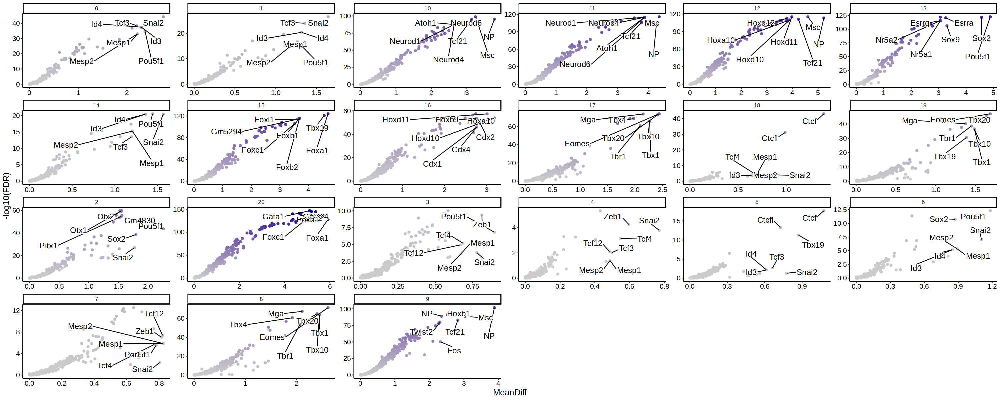

In [45]:
p = ggplot(diffMotif.dt[MeanDiff>0], aes(MeanDiff, -log10(FDR), label=motif)) +
            geom_point(aes(col = -log10(FDR))) +
            scale_color_gradient(low='gray80', high='darkblue', name = '-log10(FDR)') + 
            ggrepel::geom_text_repel(data=diffMotif.dt[MeanDiff>0] %>% 
                                            .[,head(.SD, 7), by=mofa_cluster],
                                aes(x=MeanDiff, y=-log10(FDR)), 
                                 max.overlaps=Inf, 
                                 box.padding = 0.8,
                                 bg.color='white', 
                                 bg.r = 0.1,
                                 size=5) +
    facet_wrap(~mofa_cluster, scales='free', ncol=6) + 
    theme_classic() +
    theme(
       axis.text = element_text(color='black'),
      # axis.title = element_text(size=rel(1.0), color='black'),
        strip.text = element_text(size=10),
      text=element_text(size=15),
      legend.position="none"
    ) 
options(repr.plot.width=25, repr.plot.height=15)
p

##### CISBP in silico ChIP

In [51]:
# Differential ChromVAR one v all
diffMotif <- getMarkerFeatures(
    ArchRProj = ArchRProject, 
    testMethod = "wilcoxon",
    binarize = FALSE,
    useMatrix = "silicoChIP_CISBP",
    groupBy = "mofa_cluster",
    useSeqnames="z",
    verbose = F
)

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-24d5b066dfaf10-Date-2024-09-02_Time-14-09-20.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Assays.Matrix

ArchR logging successful to : ArchRLogs/ArchR-getMarkerFeatures-24d5b066dfaf10-Date-2024-09-02_Time-14-09-20.log



In [47]:
saveRDS(diffMotif, sprintf('%s/diff_chromVAR_CISBP_insilico.rds', args$outdir))

In [71]:
diffMotif_save = lapply(1:21, function(x){
    diffMotif.tmp = diffMotif[,x]
    tmp = data.table(cluster = x-1,
                     motif = str_split(rowData(diffMotif)$name, '_') %>% map_chr(1),
                     FDR = diffMotif.tmp@assays@data$FDR,
                     MeanDiff = diffMotif.tmp@assays@data$MeanDiff)
    return(tmp)
}) %>% as.data.table()

In [72]:
fwrite(diffMotif_save, sprintf('%s/diff_chromVAR_CISBP_insilico.csv', args$outdir))

In [48]:
diffMotif.dt = lapply(colnames(diffMotif), function(x){
    tmp = data.table(motif = str_split(rowData(diffMotif)$name, '_') %>% map_chr(1),
                                  FDR = assay(diffMotif[,x], 'FDR')[[1]],
                                  MeanDiff = assay(diffMotif[,x], 'MeanDiff')[[1]]) %>% 
                        .[order(-MeanDiff)] %>% 
                        .[,mofa_cluster := x]
    return(tmp)
}) %>% rbindlist()

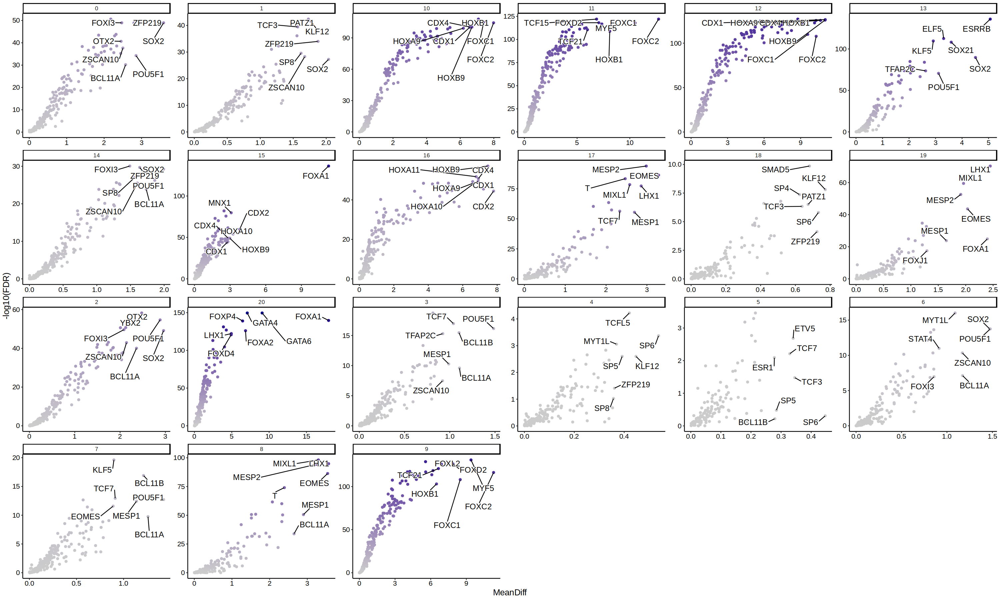

In [50]:
p = ggplot(diffMotif.dt[MeanDiff>0], aes(MeanDiff, -log10(FDR), label=motif)) +
            geom_point(aes(col = -log10(FDR))) +
            scale_color_gradient(low='gray80', high='darkblue', name = '-log10(FDR)') + 
            ggrepel::geom_text_repel(data=diffMotif.dt[MeanDiff>0] %>% 
                                            .[,head(.SD, 7), by=mofa_cluster],
                                aes(x=MeanDiff, y=-log10(FDR)), 
                                 max.overlaps=Inf, 
                                 box.padding = 0.8,
                                 bg.color='white', 
                                 bg.r = 0.1,
                                 size=5) +
    facet_wrap(~mofa_cluster, scales='free', ncol=6) + 
    theme_classic() +
    theme(
       axis.text = element_text(color='black'),
      # axis.title = element_text(size=rel(1.0), color='black'),
        strip.text = element_text(size=10),
      text=element_text(size=15),
      legend.position="none"
    ) 
options(repr.plot.width=25, repr.plot.height=15)
p

In [73]:
# Differential ChromVAR one v all
diffMotif <- getMarkerFeatures(
    ArchRProj = ArchRProject, 
    testMethod = "wilcoxon",
    binarize = FALSE,
    useMatrix = "silicoChIP_CISBP",
    groupBy = "mofa_clusters_combined",
    useSeqnames="z",
    verbose = F
)

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-24d5b012dcd04e-Date-2024-09-02_Time-14-15-46.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Assays.Matrix

ArchR logging successful to : ArchRLogs/ArchR-getMarkerFeatures-24d5b012dcd04e-Date-2024-09-02_Time-14-15-46.log



In [74]:
saveRDS(diffMotif, sprintf('%s/diff_chromVAR_CISBP_insilico_combined.rds', args$outdir))

In [75]:
diffMotif.dt = lapply(colnames(diffMotif), function(x){
    tmp = data.table(motif = str_split(rowData(diffMotif)$name, '_') %>% map_chr(1),
                                  FDR = assay(diffMotif[,x], 'FDR')[[1]],
                                  MeanDiff = assay(diffMotif[,x], 'MeanDiff')[[1]]) %>% 
                        .[order(-MeanDiff)] %>% 
                        .[,mofa_cluster := x]
    return(tmp)
}) %>% rbindlist()

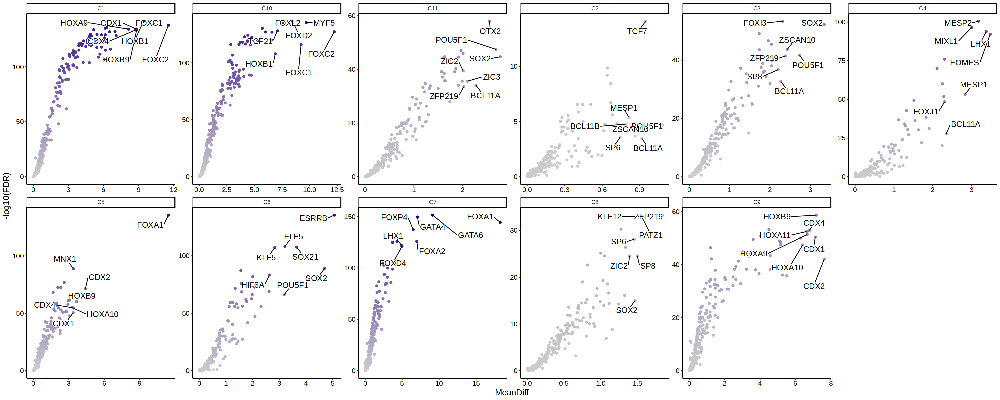

In [76]:
p = ggplot(diffMotif.dt[MeanDiff>0], aes(MeanDiff, -log10(FDR), label=motif)) +
            geom_point(aes(col = -log10(FDR))) +
            scale_color_gradient(low='gray80', high='darkblue', name = '-log10(FDR)') + 
            ggrepel::geom_text_repel(data=diffMotif.dt[MeanDiff>0] %>% 
                                            .[,head(.SD, 7), by=mofa_cluster],
                                aes(x=MeanDiff, y=-log10(FDR)), 
                                 max.overlaps=Inf, 
                                 box.padding = 0.8,
                                 bg.color='white', 
                                 bg.r = 0.1,
                                 size=5) +
    facet_wrap(~mofa_cluster, scales='free', ncol=6) + 
    theme_classic() +
    theme(
       axis.text = element_text(color='black'),
      # axis.title = element_text(size=rel(1.0), color='black'),
        strip.text = element_text(size=10),
      text=element_text(size=15),
      legend.position="none"
    ) 
options(repr.plot.width=25, repr.plot.height=10)
p

### Motif Enrichment

In [10]:
plot_enr_heatmap = function(enrichMotifs, ntop=25) {
    heatmapEM <- plotEnrichHeatmap(enrichMotifs, n = ntop, returnMatrix = TRUE)

    enriched.dt = melt(as.data.table(heatmapEM, keep.rownames=T) %>% setnames('rn', 'TF'), id.vars = c("TF")) %>%
        .[order(-value)] %>% .[,TF:=strsplit(TF, '_') %>% map_chr(1)]

    keep_tfs = enriched.dt %>% .[,variable:=factor(variable, levels=cluster_levels)] %>% .[order(variable)] %>% .[, head(.SD, ntop),  by=variable] %>% .$TF   
    enriched.dt = enriched.dt[TF %in% keep_tfs] %>% .[order( -value)] %>% 
        #.[,TF:=strsplit(TF, '_') %>% map_chr(1)] %>%
         .[,TF:=factor(TF, levels=unique(keep_tfs))] %>%
        .[,variable:=factor(variable, levels=cluster_levels)]
    
    p = ggplot(enriched.dt, aes(TF, variable, fill=value)) + 
    geom_tile(col='black') +
    scale_fill_gradient(low='white', high='darkblue', name='Norm. Enrichment -log10(P-adj) [0-max]') +
    theme_void() + theme(text=element_text(size=15), 
                         axis.text.x=element_text(angle=-90,hjust=0,vjust=0.5, size=15), 
                         axis.text.y=element_text(hjust=0),
                        legend.position='bottom')
p
    return(p)
}

In [16]:
markersPeaks <- getMarkerFeatures(
    ArchRProj = ArchRProject, 
    useMatrix = "PeakMatrix", 
    groupBy = "mofa_cluster",
    bias = c("TSSEnrichment", "log10(nFrags)"),
    binarize = TRUE,
    testMethod = "binomial"
)

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-27babb1c804be3-Date-2024-09-02_Time-14-31-16.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Integer.Matrix

2024-09-02 14:31:24 : Matching Known Biases, 0.136 mins elapsed.

###########
2024-09-02 14:32:58 : Completed Pairwise Tests, 1.697 mins elapsed.
###########

ArchR logging successful to : ArchRLogs/ArchR-getMarkerFeatures-27babb1c804be3-Date-2024-09-02_Time-14-31-16.log



In [28]:
suppressPackageStartupMessages(library(BSgenome.Mmusculus.UCSC.mm10))
ArchRProject <- addMotifAnnotations(ArchRProj = ArchRProject, motifSet = "cisbp")

ArchR logging to : ArchRLogs/ArchR-addMotifAnnotations-27babb6edfc850-Date-2024-09-02_Time-14-43-38.log
If there is an issue, please report to github with logFile!

peakAnnotation name already exists! Overriding.

2024-09-02 14:43:38 : Gettting Motif Set, Species : Mus musculus, 0.002 mins elapsed.

Using version 2 motifs!

2024-09-02 14:43:41 : Finding Motif Positions with motifmatchr!, 0.048 mins elapsed.

2024-09-02 14:45:06 : All Motifs Overlap at least 1 peak!, 1.47 mins elapsed.

2024-09-02 14:45:06 : Creating Motif Overlap Matrix, 1.47 mins elapsed.

2024-09-02 14:45:08 : Finished Getting Motif Info!, 1.489 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-addMotifAnnotations-27babb6edfc850-Date-2024-09-02_Time-14-43-38.log



In [31]:
ArchRProject@peakAnnotation

List of length 1
names(1): Motif

In [32]:
# CISBP
enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = markersPeaks,
    ArchRProj = ArchRProject,
    peakAnnotation = "Motif",
    cutOff = "FDR <= 0.1 & Log2FC >= 0.5"
  ))
colnames(enrichMotifs) = 0:20

In [34]:
cluster_levels = c(12,11,10,9,
                   20,19,17,8,
                   0,14,
                   3,4,5,6,7,
                   1,2,
                   13, 15, 18, 16
                  )

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-27babb4715c592-Date-2024-09-02_Time-14-46-37.log
If there is an issue, please report to github with logFile!



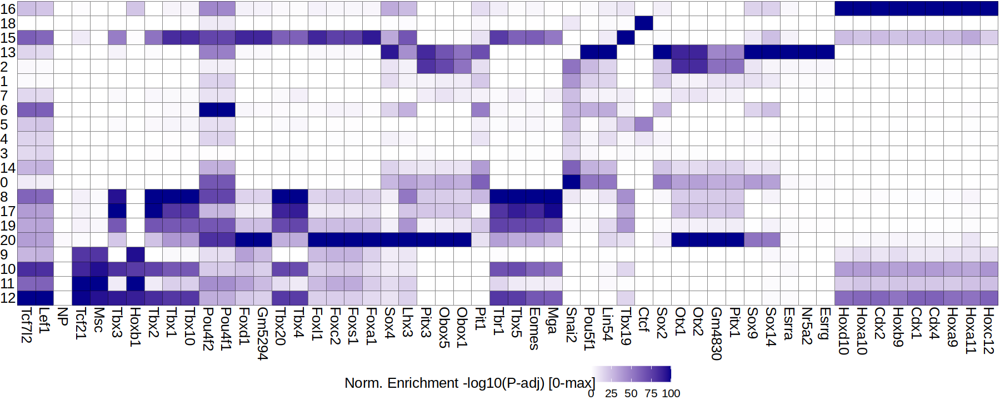

In [35]:
options(repr.plot.width=15, repr.plot.height=6)
plot_enr_heatmap(enrichMotifs, ntop = 10)

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-27babb31ca6cfb-Date-2024-09-02_Time-14-48-59.log
If there is an issue, please report to github with logFile!



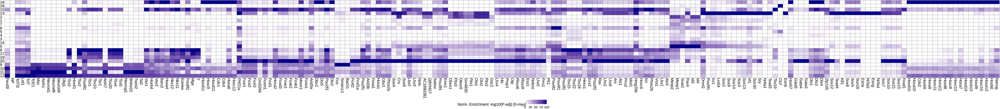

In [37]:
options(repr.plot.width=55, repr.plot.height=6)
plot_enr_heatmap(enrichMotifs, ntop = 50)

In [38]:
# In silico ChIP
io$multiome = '/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/results/multiome_atlas/'
cisbp_silico_chip = readRDS(file.path(io$multiome, 'vitro_peaks_silicoChIP_cisbp.rds'))
assay(cisbp_silico_chip, 'matches') = assay(cisbp_silico_chip, 'VirtualChipScores') > 0.20
assay(cisbp_silico_chip, 'motifScores') = NULL
assay(cisbp_silico_chip, 'motifMatches') = NULL
assay(cisbp_silico_chip, 'motifCounts') = NULL
assay(cisbp_silico_chip, 'VirtualChipScores') = NULL
# Keep only motifs with more than 40 peaks 
tmp = colSums(assay(cisbp_silico_chip, 'matches') )
keep = names(tmp[tmp > 40])
cisbp_silico_chip = cisbp_silico_chip[,keep]

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-27babb39426133-Date-2024-09-02_Time-14-49-09.log
If there is an issue, please report to github with logFile!

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-27babb1ba66ce4-Date-2024-09-02_Time-14-49-10.log
If there is an issue, please report to github with logFile!



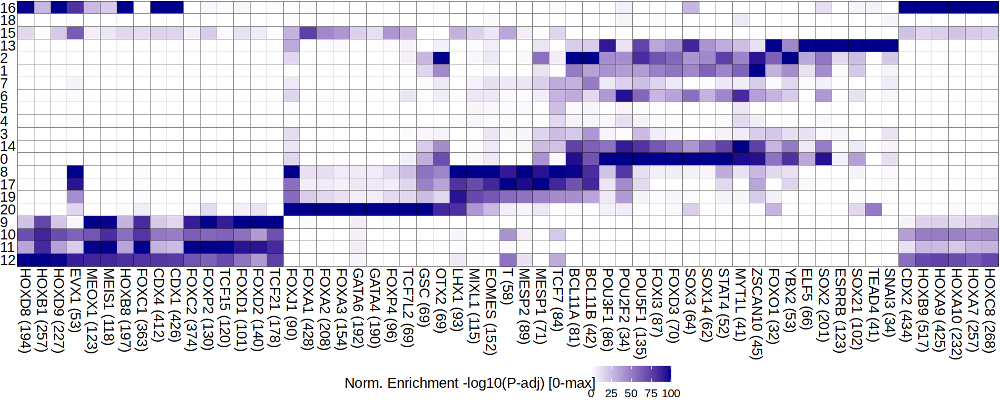

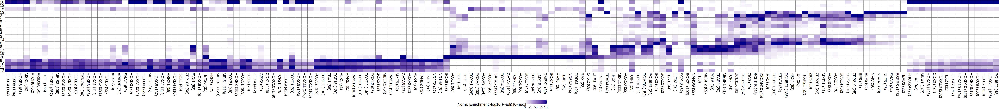

In [39]:
# silicoChip v2 cisbp
enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = markersPeaks,
    ArchRProj = ArchRProject,
    #peakAnnotation = "silicoChIP_CISBP",
    matches = cisbp_silico_chip,
    cutOff = "FDR <= 0.1 & Log2FC >= 0.5"
  ))

options(repr.plot.width=15, repr.plot.height=6)
plot_enr_heatmap(enrichMotifs, ntop = 10)

options(repr.plot.width=55, repr.plot.height=6)
plot_enr_heatmap(enrichMotifs, ntop = 50)

#### Group bigwigs

In [16]:
# Get bigwigs
addArchRThreads(38)

Setting default number of Parallel threads to 38.



In [14]:
ArchRProject@cellColData$mofa_cluster = as.character(ArchRProject@cellColData$mofa_cluster)

In [18]:
getGroupBW(
  ArchRProj = ArchRProject,
  groupBy = "mofa_cluster",
  normMethod = "ReadsInTSS",
  tileSize = 100,
  maxCells = 1e9,
  ceiling = 1e9,
  verbose = TRUE
)

ArchR logging to : ArchRLogs/ArchR-getGroupBW-6c520578ca460-Date-2024-09-03_Time-12-12-28.log
If there is an issue, please report to github with logFile!

2024-09-03 12:12:34 : 0 (1 of 21) : Creating BigWig for Group, 0.106 mins elapsed.

2024-09-03 12:13:06 : 1 (2 of 21) : Creating BigWig for Group, 0.632 mins elapsed.

2024-09-03 12:13:33 : 10 (3 of 21) : Creating BigWig for Group, 1.086 mins elapsed.

2024-09-03 12:13:52 : 11 (4 of 21) : Creating BigWig for Group, 1.409 mins elapsed.

2024-09-03 12:14:12 : 12 (5 of 21) : Creating BigWig for Group, 1.729 mins elapsed.

2024-09-03 12:14:31 : 13 (6 of 21) : Creating BigWig for Group, 2.048 mins elapsed.

2024-09-03 12:14:56 : 14 (7 of 21) : Creating BigWig for Group, 2.464 mins elapsed.

2024-09-03 12:15:20 : 15 (8 of 21) : Creating BigWig for Group, 2.863 mins elapsed.

2024-09-03 12:15:39 : 16 (9 of 21) : Creating BigWig for Group, 3.179 mins elapsed.

2024-09-03 12:16:02 : 17 (10 of 21) : Creating BigWig for Group, 3.564 mins elapse

[1] "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/processed/atac/archR/GroupBigWigs/mofa_cluster/X0-TileSize-100-normMethod-ReadsInTSS-ArchR.bw" 
 [2] "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/processed/atac/archR/GroupBigWigs/mofa_cluster/X1-TileSize-100-normMethod-ReadsInTSS-ArchR.bw" 
 [3] "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/processed/atac/archR/GroupBigWigs/mofa_cluster/X10-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"
 [4] "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/processed/atac/archR/GroupBigWigs/mofa_cluster/X11-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"
 [5] "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/processed/atac/archR/GroupBigWigs/mofa_cluster/X12-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"
 [6] "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/processed/atac/archR/GroupBigWigs/mofa_cluster/X13-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"
 [7] "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/processed/atac/archR/GroupBigWigs/mofa_cluster/X14-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"
 [8] "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/processed/atac/archR/GroupBigWigs/mofa_cluster/X15-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"
 [9] "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/processed/atac/archR/GroupBigWigs/mofa_cluster/X16-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"
[10] "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/processed/atac/archR/GroupBigWigs/mofa_cluster/X17-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"
[11] "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/processed/atac/archR/GroupBigWigs/mofa_cluster/X18-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"
[12] "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/processed/atac/archR/GroupBigWigs/mofa_cluster/X19-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"
[13] "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/processed/atac/archR/GroupBigWigs/mofa_cluster/X2-TileSize-100-normMethod-ReadsInTSS-ArchR.bw" 
[14] "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/processed/atac/archR/GroupBigWigs/mofa_cluster/X20-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"
[15] "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/processed/atac/archR/GroupBigWigs/mofa_cluster/X3-TileSize-100-normMethod-ReadsInTSS-ArchR.bw" 
[16] "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/processed/atac/archR/GroupBigWigs/mofa_cluster/X4-TileSize-100-normMethod-ReadsInTSS-ArchR.bw" 
[17] "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/processed/atac/archR/GroupBigWigs/mofa_cluster/X5-TileSize-100-normMethod-ReadsInTSS-ArchR.bw" 
[18] "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/processed/atac/archR/GroupBigWigs/mofa_cluster/X6-TileSize-100-normMethod-ReadsInTSS-ArchR.bw" 
[19] "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/processed/atac/archR/GroupBigWigs/mofa_cluster/X7-TileSize-100-normMethod-ReadsInTSS-ArchR.bw" 
[20] "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/processed/atac/archR/GroupBigWigs/mofa_cluster/X8-TileSize-100-normMethod-ReadsInTSS-ArchR.bw" 
[21] "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/processed/atac/archR/GroupBigWigs/mofa_cluster/X9-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"

## Label Transfer

In [41]:
mapping = fread(args$mapping)[match(umap$cell, cell)]

In [42]:
summary(mapping$cell == umap$cell)

   Mode    TRUE 
logical   46547 

In [43]:
mapping = cbind(mapping, copy(umap)[,cell:=NULL])

In [44]:
colnames(mapping)

[1] "cell"                      "barcode"                  
 [3] "sample"                    "nFeature_RNA"             
 [5] "nCount_RNA"                "mitochondrial_percent_RNA"
 [7] "ribosomal_percent_RNA"     "alias"                    
 [9] "day"                       "genotype"                 
[11] "pass_rnaQC"                "doublet_score"            
[13] "doublet_call"              "celltype"                 
[15] "celltype.score"            "closest.cell"             
[17] "day_celltype"              "celltype_genotype"        
[19] "UMAP1"                     "UMAP2"

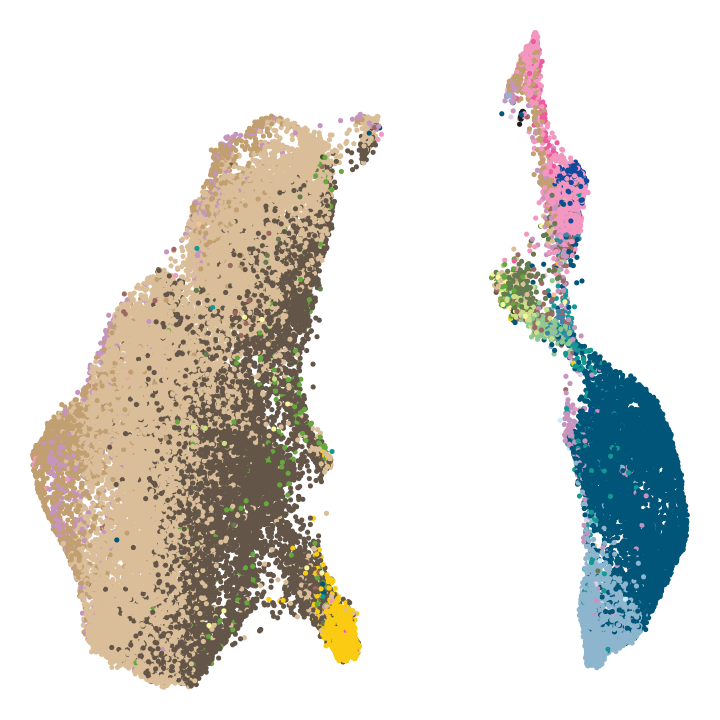

In [46]:
options(repr.plot.width=6, repr.plot.height=6)
p1 = ggplot(mapping, aes(UMAP1, UMAP2, col=celltype)) + 
    geom_point(size=0.4) + 
    scale_color_manual(values=opts$celltype.colors) + 
    theme_void() + 
    theme(legend.position = 'none')
p1

In [48]:
mapping$mofa_cluster = meta$mofa_cluster

In [53]:
# Plot mapped vs actual cell-types
proportions = copy(mapping) %>%
    .[,c('mofa_cluster', 'celltype')] %>% 
    .[, Ntot := .N, by = 'mofa_cluster'] %>% 
    .[, N := .N, by = c('mofa_cluster', 'celltype')] %>% 
    unique(by = c('mofa_cluster', 'celltype')) %>%
    .[, prop := N/Ntot]

combinations <- as.data.table(expand.grid(unique(proportions$mofa_cluster), unique(proportions$celltype))) %>%
    setnames(c('Var1', 'Var2'), c('mofa_cluster', 'celltype'))
proportions = merge(combinations, proportions, all.x=T) %>% 
    .[, prop:=ifelse(is.na(prop), 0, prop)]

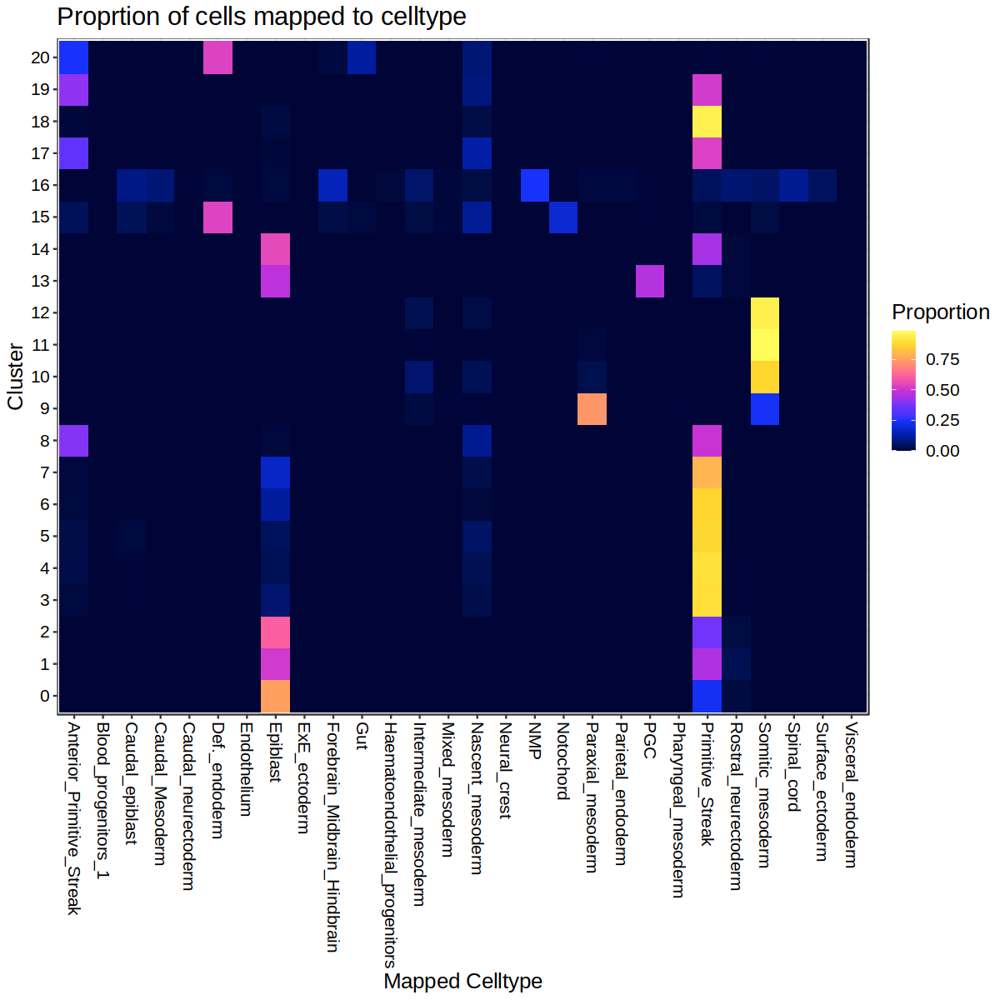

In [54]:
options(repr.plot.width=10, repr.plot.height=10)
ggplot(proportions[, mofa_cluster := factor(mofa_cluster, levels = 0:20)], aes(celltype, mofa_cluster, fill=prop)) +
    geom_tile() +
    scale_fill_gradientn(colours=ArchR::ArchRPalettes$horizonExtra, name='Proportion')+
    ggtitle('Proprtion of cells mapped to celltype') + 
    xlab('Mapped Celltype') + ylab('Cluster') + 
    theme_bw() + 
    theme(text=element_text(color='black', size=15),
          axis.text = element_text(color='black', size=12),
          axis.text.x = element_text(angle=-90, hjust=0, vjust=0.5))

Annotations based on incorporating all information: </br>
0 Early mesoderm, Eo dependent 2 </br>
1 Early mesoderm, Eo dependent 1 </br>
2 PS 2 </br>
3 HEP </br>
4 Posterior mesoderm </br>
5 Mesenchyme </br>
6 Early mesoderm, Eo independent 1 (maybe need to substract PGCs) </br>
7 PS 1 </br>
8 Early mesoderm, Eo independent 2 </br>
9 Early mesoderm, Eo independent 3 </br>
10 Allantois </br>
11 PS 4 </br>
12 Allantois progenitor </br>
13 Posterior mesoderm </br>
14 HEP progenitors </br>
15 Endothelium </br>
16 PS 3 </br>
17 Blood progenitor </br>

In [7]:
opts$clusters2groups = c(
    '0' = 'C3',
    '1' = 'C8',
    '2' = 'C11',
    '3' = 'C2',
    '4' = 'C2',
    '5' = 'C2',
    '6' = 'C2',
    '7' = 'C2',
    '8' = 'C4',
    '9' = 'C10',
    '10' = 'C1',
    '11' = 'C1',
    '12' = 'C1',
    '13' = 'C6',
    '14' = 'C3',
    '15' = 'C5',
    '16' = 'C9',
    '17' = 'C4',
    '18' = 'C8',
    '19' = 'C4',
    '20' = 'C7'
)

# Day 4.5 annotation

In [16]:
set.seed(1234)

In [17]:
factors = fread(args$MOFA_factors)[match(meta$cell, cell)] %>%
    .[meta$day == 'D4.5']

In [18]:
d45_umap = uwot::umap(factors[,-1], n_neighbors = 25, min_dist = 0.2)

In [19]:
d45_umap = as.data.table(d45_umap) %>%
    setnames(c('umap1', 'umap2'))

In [20]:
# load sce
d45_rna.sce = rna.sce[,meta[day == 'D4.5', cell]]

# Convert to Seurat
seurat = as.Seurat(d45_rna.sce)

In [21]:
summary(colnames(seurat) == factors$cell)

   Mode    TRUE 
logical   11919 

In [22]:
# Prepare mofa umap
factors.mtx = factors %>% 
    as.data.frame(.) %>% 
    tibble::column_to_rownames('cell') %>%
    as.matrix()
seurat[["mofa"]] <- CreateDimReducObject(embeddings = factors.mtx, key = "mofa_", assay = DefaultAssay(seurat))

In [23]:
d45_umap.mtx = d45_umap %>% 
    .[,cell := meta[day == 'D4.5', cell]] %>% 
    as.data.frame(.) %>% 
    tibble::column_to_rownames('cell') %>%
    as.matrix()

seurat[["umap"]] <- CreateDimReducObject(embeddings = d45_umap.mtx, key = "umap_", assay = DefaultAssay(seurat))

In [24]:
seurat <- FindNeighbors(seurat, dims = 1:17, reduction = 'mofa')
seurat <- FindClusters(seurat, resolution = 0.2)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 11919
Number of edges: 401676

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9238
Number of communities: 7
Elapsed time: 1 seconds


Warning message:
“UNRELIABLE VALUE: One of the ‘future.apply’ iterations (‘future_lapply-1’) unexpectedly generated random numbers without declaring so. There is a risk that those random numbers are not statistically sound and the overall results might be invalid. To fix this, specify 'future.seed=TRUE'. This ensures that proper, parallel-safe random numbers are produced via the L'Ecuyer-CMRG method. To disable this check, use 'future.seed = NULL', or set option 'future.rng.onMisuse' to "ignore".”


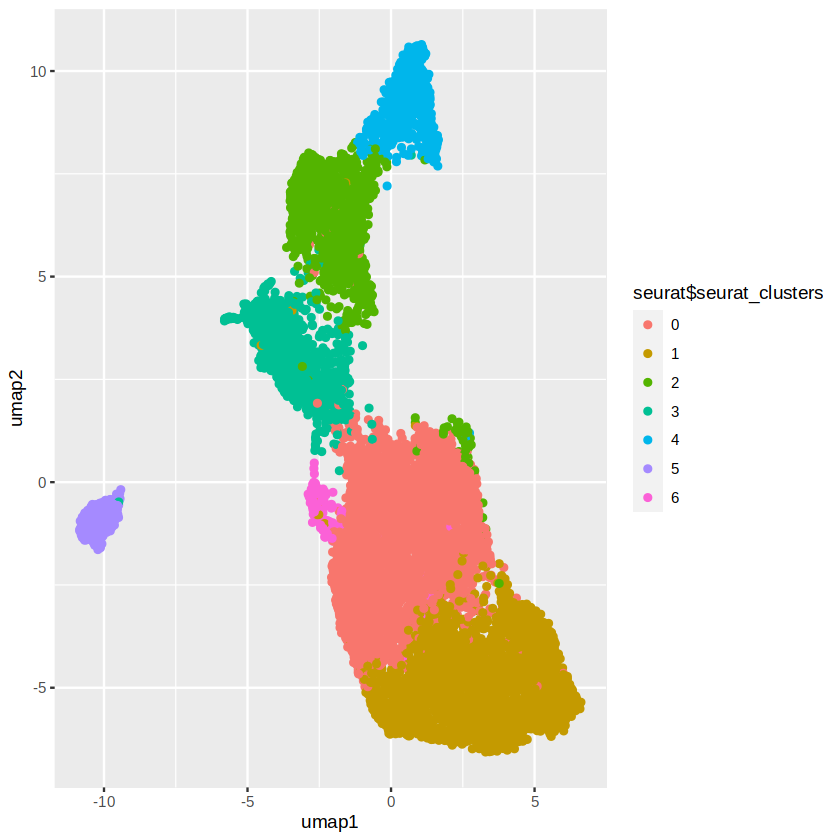

In [25]:
ggplot(d45_umap, aes(umap1, umap2, color = seurat$seurat_clusters)) + geom_point()

In [26]:
Idents(seurat) =  seurat$seurat_clusters

In [27]:
all.genes <- rownames(seurat)
seurat = ScaleData(seurat, features = all.genes)

Centering and scaling data matrix



In [29]:
# find markers for every cluster compared to all remaining cells, report only the positive
# ones
markers <- FindAllMarkers(seurat, only.pos = TRUE)
markers %>%
    group_by(cluster) %>%
    # dplyr::filter(avg_log2FC > 1) %>%
    slice_head(n = 30) %>%
    ungroup() -> top30


Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6



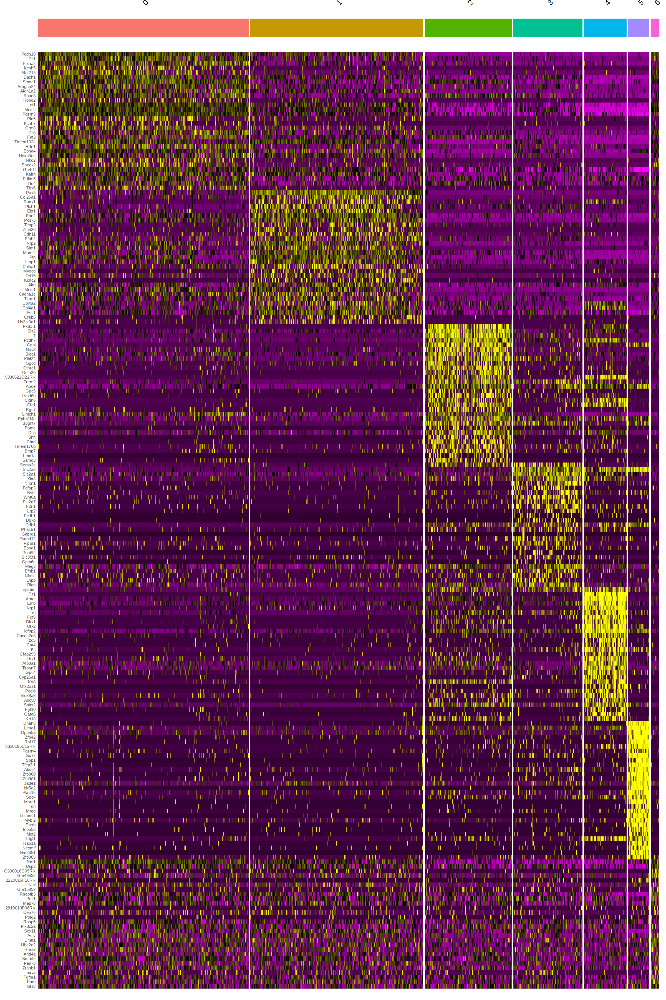

In [30]:
options(repr.plot.width=20, repr.plot.height=30)

DoHeatmap(seurat, features = top30$gene) + NoLegend()

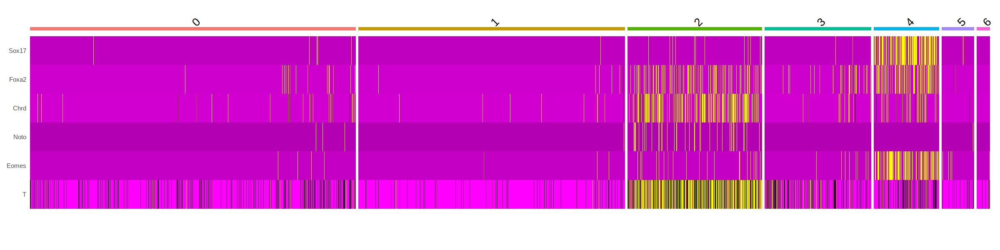

In [31]:
options(repr.plot.width=20, repr.plot.height=5)
features = c('Sox17', 'Foxa2', 'Chrd', 'Noto', 'Eomes', 'T')
DoHeatmap(seurat, features = features) + NoLegend()

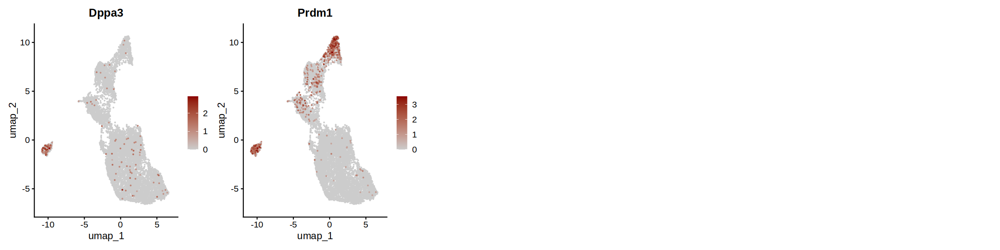

In [32]:
features = c('Dppa3', 'Prdm1')

options(repr.plot.width=20, repr.plot.height=5)
FeaturePlot(seurat, 
            features = features, 
            cols = c('grey80', 'darkred'),
            ncol = 6,
            order = T)

In [34]:
cluster2celltype = c(
    '0' = 'Somitic Mesoderm', # Dll1 & Tbx6 + label transfer
    '1' = 'Paraxial Mesoderm', # Ebf1, Cdh11 & Fbn2 + label transfer
    '2' = 'Notochord', # Chrd, T, Foxa2, Slit2
    '3' = 'Ectoderm-like', # but Wnt8a, Sema3e, Fgfbp3 == ectoderm!! But also some notochord markers
    '4' = 'DE/Gut', # 
    '5' = 'PGC', # Dppa3 == stella & prdm1 == blimp1
    '6' = 'unknown'
)

In [35]:
cluster2celltype

0                   1                   2                   3 
 "Somitic Mesoderm" "Paraxial Mesoderm"         "Notochord"     "Ectoderm-like" 
                  4                   5                   6 
           "DE/Gut"               "PGC"           "unknown"

In [36]:
d45_meta = as.data.table(seurat@meta.data, keep.rownames = T) %>%
    setnames('rn', 'cell') %>%
    .[, celltype_manual := cluster2celltype[match(seurat_clusters, names(cluster2celltype))]]

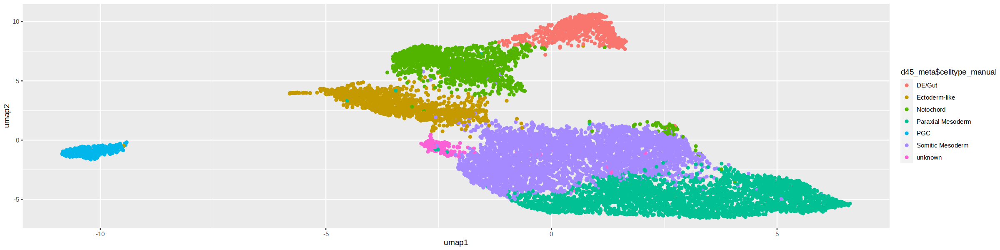

In [37]:
ggplot(d45_umap, aes(umap1, umap2, color = d45_meta$celltype_manual)) + geom_point()

In [38]:
args$outdir

[1] "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/results/rna_atac/clustering/"

In [40]:
fwrite(d45_meta, file.path(args$outdir, 'd45_celltypes.txt.gz'))
fwrite(d45_umap, file.path(args$outdir, 'd45_umap.txt.gz'))


# Day 2.5 and day 3 annotation

In [8]:
set.seed(1234)

In [9]:
options(repr.plot.width=20, repr.plot.height=5)

In [10]:
factors = fread(args$MOFA_factors)[match(meta$cell, cell)] %>%
    .[meta$day != 'D4.5']

In [11]:
umap = uwot::umap(factors[,-1], n_neighbors = 25, min_dist = 0.2)

In [12]:
umap = as.data.table(umap) %>%
    setnames(c('umap1', 'umap2'))

In [13]:
# load sce
early_rna.sce = rna.sce[,meta[day != 'D4.5', cell]]

# Convert to Seurat
seurat = as.Seurat(early_rna.sce)

In [14]:
summary(colnames(seurat) == factors$cell)

   Mode    TRUE 
logical   34628 

In [15]:
# Prepare mofa umap
factors.mtx = factors %>% 
    as.data.frame(.) %>% 
    tibble::column_to_rownames('cell') %>%
    as.matrix()
seurat[["mofa"]] <- CreateDimReducObject(embeddings = factors.mtx, key = "mofa_", assay = DefaultAssay(seurat))

In [16]:
umap.mtx = umap %>% 
    .[,cell := meta[day != 'D4.5', cell]] %>% 
    as.data.frame(.) %>% 
    tibble::column_to_rownames('cell') %>%
    as.matrix()

seurat[["umap"]] <- CreateDimReducObject(embeddings = umap.mtx, key = "umap_", assay = DefaultAssay(seurat))

In [17]:
seurat <- FindNeighbors(seurat, dims = 1:17, reduction = 'mofa')
seurat <- FindClusters(seurat, resolution = 0.2)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 34628
Number of edges: 926150

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8913
Number of communities: 6
Elapsed time: 6 seconds


Warning message:
“UNRELIABLE VALUE: One of the ‘future.apply’ iterations (‘future_lapply-1’) unexpectedly generated random numbers without declaring so. There is a risk that those random numbers are not statistically sound and the overall results might be invalid. To fix this, specify 'future.seed=TRUE'. This ensures that proper, parallel-safe random numbers are produced via the L'Ecuyer-CMRG method. To disable this check, use 'future.seed = NULL', or set option 'future.rng.onMisuse' to "ignore".”


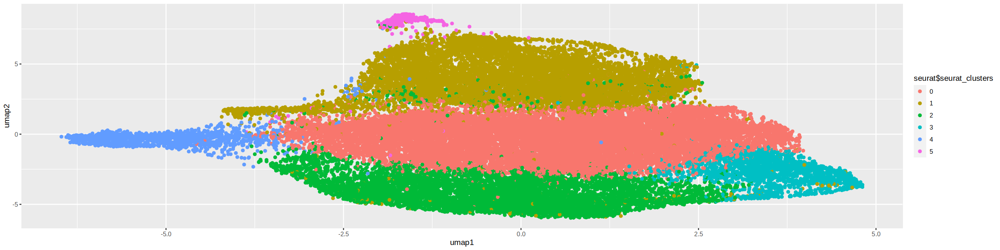

In [18]:
ggplot(umap, aes(umap1, umap2, color = seurat$seurat_clusters)) + geom_point()

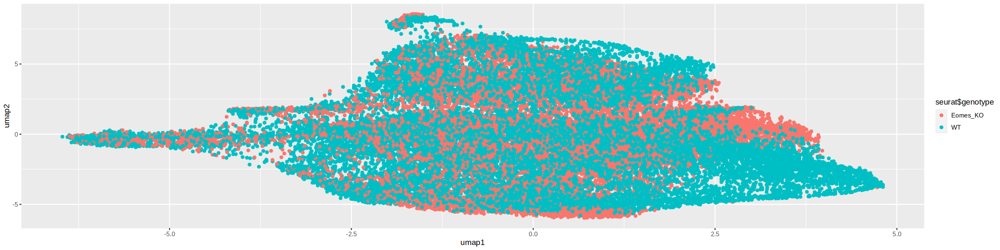

In [19]:
ggplot(umap, aes(umap1, umap2, color = seurat$genotype)) + geom_point()

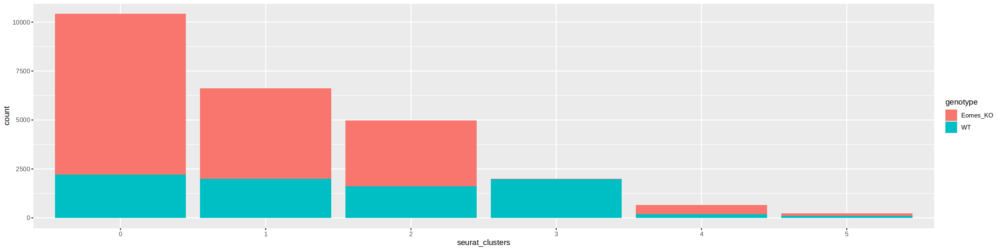

In [20]:
ggplot(seurat@meta.data[seurat@meta.data$day == 'D3',], aes(seurat_clusters, fill = genotype)) + 
    geom_bar()

In [21]:
Idents(seurat) =  seurat$seurat_clusters

In [22]:
all.genes <- rownames(seurat)
seurat = ScaleData(seurat, features = all.genes)

Centering and scaling data matrix



In [23]:
# find markers for every cluster compared to all remaining cells, report only the positive
# ones
markers <- FindAllMarkers(seurat, only.pos = TRUE)
markers %>%
    group_by(cluster) %>%
    # dplyr::filter(avg_log2FC > 1) %>%
    slice_head(n = 30) %>%
    ungroup() -> top30


Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5



Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


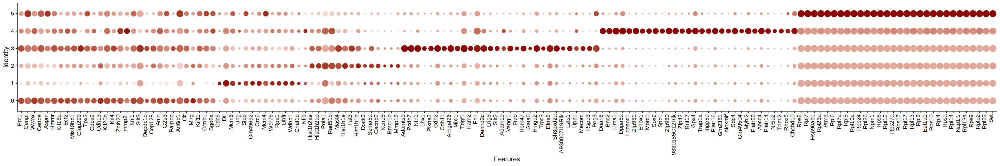

In [24]:
options(repr.plot.width=30, repr.plot.height=5)

DotPlot(object = seurat, features = top30$gene) + 
    NoLegend() + 
    scale_color_gradient(low='white', high='darkred', name='Average Expression') + 
    theme(axis.text.x = element_text(angle = 90, hjust = 1, vjust = 0))

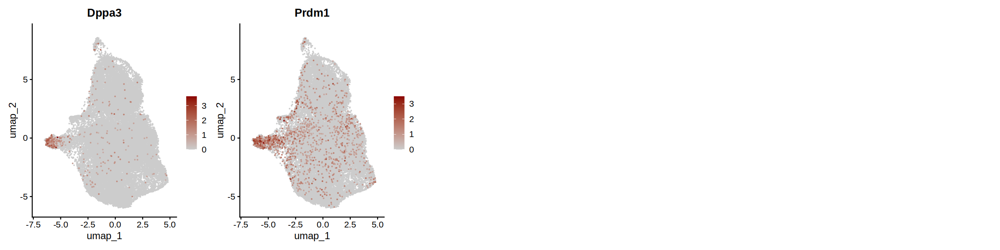

In [25]:
features = c('Dppa3', 'Prdm1')

options(repr.plot.width=20, repr.plot.height=5)
FeaturePlot(seurat, 
            features = features, 
            cols = c('grey80', 'darkred'),
            ncol = 6,
            order = T)

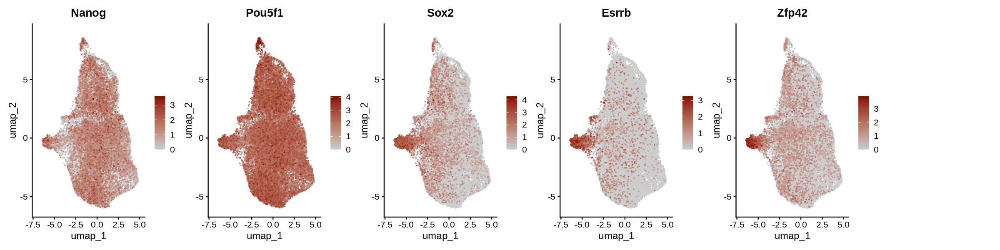

In [26]:
features = c('Nanog', 'Pou5f1', 'Sox2', 'Esrrb', 'Zfp42')

options(repr.plot.width=20, repr.plot.height=5)
FeaturePlot(seurat, 
            features = features, 
            cols = c('grey80', 'darkred'),
            ncol = 6,
            order = T)

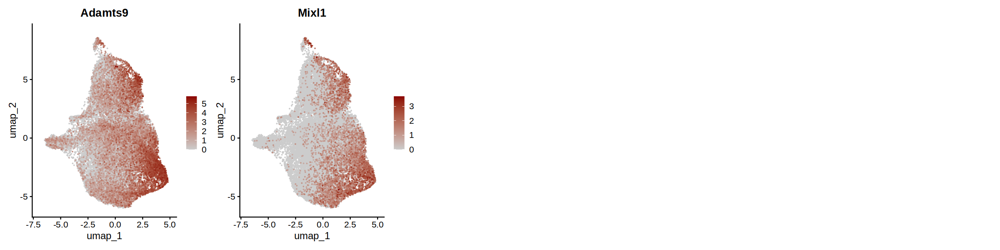

In [27]:
features = c('Adamts9', 'Mixl1')

options(repr.plot.width=20, repr.plot.height=5)
FeaturePlot(seurat, 
            features = features, 
            cols = c('grey80', 'darkred'),
            ncol = 6,
            order = T)

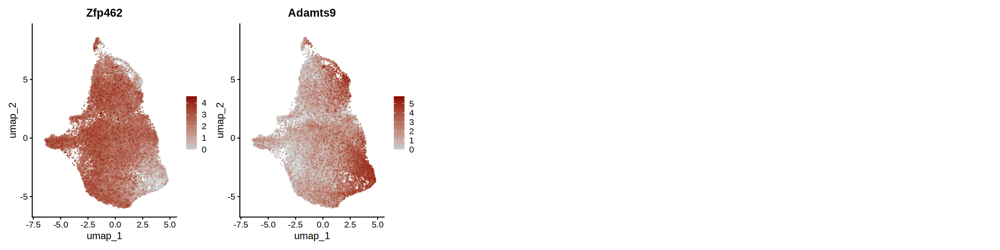

In [28]:
features = c('Zfp462', 'Adamts9')

options(repr.plot.width=20, repr.plot.height=5)
FeaturePlot(seurat, 
            features = features, 
            cols = c('grey80', 'darkred'),
            ncol = 6,
            order = T)

In [29]:
PS

ERROR: Error in eval(expr, envir, enclos): object 'PS' not found


In [30]:
cluster2celltype = c(
    '0' = 'PS 1',
    '1' = 'PS 2',
    '2' = 'PS 3',
    '3' = 'PS Eomes-dependent', # Mixl1, Gata6, Lhx1, 
    '4' = 'Epiblast', # Mostly epiblast, bit of PGC markers: Dppa3 == stella & prdm1 == blimp1
    '5' = 'unknown'
)

In [31]:
cluster2celltype

0                    1                    2 
              "PS 1"               "PS 2"               "PS 3" 
                   3                    4                    5 
"PS Eomes-dependent"           "Epiblast"            "unknown"

In [32]:
early_meta = as.data.table(seurat@meta.data, keep.rownames = T) %>%
    setnames('rn', 'cell') %>%
    .[, celltype_manual := cluster2celltype[match(seurat_clusters, names(cluster2celltype))]]

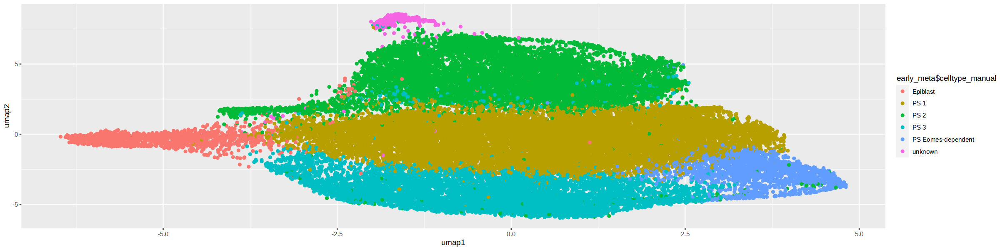

In [33]:
ggplot(umap, aes(umap1, umap2, color = early_meta$celltype_manual)) + geom_point()

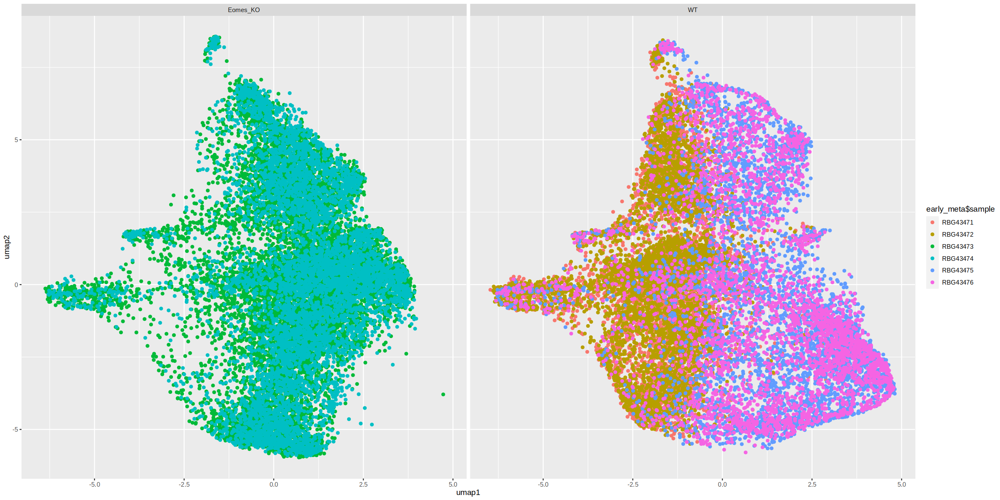

In [65]:
ggplot(umap, aes(umap1, umap2, color = early_meta$sample)) + geom_point() + 
    facet_wrap(~early_meta$genotype)

In [34]:
fwrite(early_meta[,.(cell, celltype_manual)], file.path(args$outdir, 'early_celltypes.txt.gz'))

# Call peaks on early cell types

In [37]:
library(ArchR)

In [43]:
archr = loadArchRProject(io$archR.directory)[early_meta$cell,]

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
           ___      .______        ______  __    __  .____

In [44]:
archr


           ___      .______        ______  __    __  .______      
          /   \     |   _  \      /      ||  |  |  | |   _  \     
         /  ^  \    |  |_)  |    |  ,----'|  |__|  | |  |_)  |    
        /  /_\  \   |      /     |  |     |   __   | |      /     
       /  _____  \  |  |\  \\___ |  `----.|  |  |  | |  |\  \\___.
      /__/     \__\ | _| `._____| \______||__|  |__| | _| `._____|
    



class: ArchRProject 
outputDirectory: /rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/processed/atac/archR 
samples(8): RBG43471 RBG43472 ... RBG43477 RBG43478
sampleColData names(1): ArrowFiles
cellColData names(38): Sample TSSEnrichment ... ReadsInPeaks FRIP
numberOfCells(1): 34628
medianTSS(1): 13.787
medianFrags(1): 25702

In [50]:
archr = addCellColData(
  ArchRProj = archr,
  data = early_meta$celltype_manual,
  name = 'celltype_manual',
  cells = early_meta$cell)

In [54]:
addArchRThreads(42)

Setting default number of Parallel threads to 42.



In [55]:
archr <- addGroupCoverages(ArchRProj = archr, 
                           groupBy = "celltype_manual")

ArchR logging to : ArchRLogs/ArchR-addGroupCoverages-161b4149d5a364-Date-2024-10-04_Time-16-17-30.log
If there is an issue, please report to github with logFile!

Epiblast (1 of 6) : CellGroups N = 5

PS 1 (2 of 6) : CellGroups N = 5

PS 2 (3 of 6) : CellGroups N = 5

PS 3 (4 of 6) : CellGroups N = 5

PS Eomes-dependent (5 of 6) : CellGroups N = 3

unknown (6 of 6) : CellGroups N = 5

2024-10-04 16:17:40 : Creating Coverage Files!, 0.181 mins elapsed.

2024-10-04 16:17:40 : Batch Execution w/ safelapply!, 0.181 mins elapsed.

2024-10-04 16:18:32 : Adding Kmer Bias to Coverage Files!, 1.036 mins elapsed.

Completed Kmer Bias Calculation

Adding Kmer Bias (1 of 28)

Adding Kmer Bias (2 of 28)

Adding Kmer Bias (3 of 28)

Adding Kmer Bias (4 of 28)

Adding Kmer Bias (5 of 28)

Adding Kmer Bias (6 of 28)

Adding Kmer Bias (7 of 28)

Adding Kmer Bias (8 of 28)

Adding Kmer Bias (9 of 28)

Adding Kmer Bias (10 of 28)

Adding Kmer Bias (11 of 28)

Adding Kmer Bias (12 of 28)

Adding Kmer Bias

In [56]:
archr <- addReproduciblePeakSet(
    ArchRProj = archr, 
    groupBy = "celltype_manual", 
    pathToMacs2 = findMacs2()
)

Searching For MACS2..

Found with $path!

ArchR logging to : ArchRLogs/ArchR-addReproduciblePeakSet-161b4124a071b8-Date-2024-10-04_Time-16-19-22.log
If there is an issue, please report to github with logFile!

Calling Peaks with Macs2

2024-10-04 16:19:22 : Peak Calling Parameters!, 0.003 mins elapsed.



                                Group nCells nCellsUsed nReplicates nMin nMax
Epiblast                     Epiblast   1469       1378           5   99  424
PS 1                             PS 1  14578       2500           5  500  500
PS 2                             PS 2   9066       2500           5  500  500
PS 3                             PS 3   7138       2500           5  500  500
PS Eomes-dependent PS Eomes-dependent   2002       1040           3   40  500
unknown                       unknown    375        331           5   44   82
                   maxPeaks
Epiblast             150000
PS 1                 150000
PS 2                 150000
PS 3                 150000
PS Eomes-dependent   150000
unknown              150000


2024-10-04 16:19:22 : Batching Peak Calls!, 0.003 mins elapsed.

2024-10-04 16:19:22 : Batch Execution w/ safelapply!, 0 mins elapsed.

Warning message in mccollect(jobs):
“2 parallel jobs did not deliver results”
Warning message in split.default(outSummmits, coverageMetadata$Group):
“data length is not a multiple of split variable”
2024-10-04 16:21:12 : Identifying Reproducible Peaks!, 1.843 mins elapsed.

2024-10-04 16:21:22 : Creating Union Peak Set!, 2.009 mins elapsed.

Converged after 7 iterations!

Plotting Ggplot!

2024-10-04 16:21:28 : Finished Creating Union Peak Set (211325)!, 2.096 mins elapsed.



In [57]:
new_peaks = archr@peakSet


In [59]:
new_peaks = archr@peakSet
saveRDS(new_peaks, file.path(args$outdir, 'early_peaks.rds'))

In [62]:
fwrite(as.data.table(new_peaks)[,1:3], 
       file.path(args$outdir, 'early_peaks.bed'),
      col.names = F, 
      sep = '\t')

In [63]:
args$outdir

[1] "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/results/rna_atac/clustering/"

In [67]:
archr = addCellColData(
  ArchRProj = archr,
  data = paste0(early_meta$celltype_manual, '_', early_meta$genotype),
  name = 'celltype_manual_genotype',
  cells = early_meta$cell)

In [68]:
getGroupBW(
  ArchRProj = archr,
  groupBy = "celltype_manual_genotype",
  normMethod = "ReadsInTSS",
  tileSize = 100,
  maxCells = 10000,
  ceiling = 4,
  verbose = TRUE,
  threads = getArchRThreads(),
  logFile = createLogFile("getGroupBW")
)

ArchR logging to : ArchRLogs/ArchR-getGroupBW-161b415f914664-Date-2024-10-04_Time-18-02-49.log
If there is an issue, please report to github with logFile!

2024-10-04 18:03:13 : Epiblast_Eomes_KO (1 of 12) : Creating BigWig for Group, 0.397 mins elapsed.

2024-10-04 18:03:28 : Epiblast_WT (2 of 12) : Creating BigWig for Group, 0.653 mins elapsed.

2024-10-04 18:03:45 : PS 1_Eomes_KO (3 of 12) : Creating BigWig for Group, 0.94 mins elapsed.

2024-10-04 18:04:05 : PS 1_WT (4 of 12) : Creating BigWig for Group, 1.264 mins elapsed.

2024-10-04 18:04:26 : PS 2_Eomes_KO (5 of 12) : Creating BigWig for Group, 1.615 mins elapsed.

2024-10-04 18:04:42 : PS 2_WT (6 of 12) : Creating BigWig for Group, 1.886 mins elapsed.

2024-10-04 18:05:00 : PS 3_Eomes_KO (7 of 12) : Creating BigWig for Group, 2.185 mins elapsed.

2024-10-04 18:05:16 : PS 3_WT (8 of 12) : Creating BigWig for Group, 2.452 mins elapsed.

2024-10-04 18:05:34 : PS Eomes-dependent_Eomes_KO (9 of 12) : Creating BigWig for Group, 2.75

[1] "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/processed/atac/archR/GroupBigWigs/celltype_manual_genotype/Epiblast_Eomes_KO-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"          
 [2] "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/processed/atac/archR/GroupBigWigs/celltype_manual_genotype/Epiblast_WT-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"                
 [3] "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/processed/atac/archR/GroupBigWigs/celltype_manual_genotype/PS.1_Eomes_KO-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"              
 [4] "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/processed/atac/archR/GroupBigWigs/celltype_manual_genotype/PS.1_WT-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"                    
 [5] "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/processed/atac/archR/GroupBigWigs/celltype_manual_genotype/PS.2_Eomes_KO-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"              
 [6] "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/processed/atac/archR/GroupBigWigs/celltype_manual_genotype/PS.2_WT-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"                    
 [7] "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/processed/atac/archR/GroupBigWigs/celltype_manual_genotype/PS.3_Eomes_KO-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"              
 [8] "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/processed/atac/archR/GroupBigWigs/celltype_manual_genotype/PS.3_WT-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"                    
 [9] "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/processed/atac/archR/GroupBigWigs/celltype_manual_genotype/PS.Eomes.dependent_Eomes_KO-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"
[10] "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/processed/atac/archR/GroupBigWigs/celltype_manual_genotype/PS.Eomes.dependent_WT-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"      
[11] "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/processed/atac/archR/GroupBigWigs/celltype_manual_genotype/unknown_Eomes_KO-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"           
[12] "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/processed/atac/archR/GroupBigWigs/celltype_manual_genotype/unknown_WT-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"